# **Artificial Neural Networks and Deep Learning - Second Competition 2020**
## Time Series Forecasting
***
### Team: AN30L
* Alberto Rota: *Person Code: 10615751 - Student Number: 964662 - [alberto2.rota@mail.polimi.it](mailto:alberto2.rota@mail.polimi.it)*  
* Gabriele Santicchi: *Person Code: 10579046 - Student Number: 969088 - [gabriele.santicchi@mail.polimi.it](mailto:gabriele.santicchi@mail.polimi.it)*  
* Giuseppe Venezia: *Person Code: 10622477 - Student Number: 968395 - [giuseppe.venezia@mail.polimi.it](mailto:giuseppe.venezia@mail.polimi.it)*  
***

In [1]:
import os
import numpy as np
from functools import reduce
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import pandas as pd
cmap=plt.get_cmap('tab20')
colors = [cmap(0.05*i) for i in range(20)]
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['font.sans-serif'] = "Times New Roman"
mpl.rcParams['font.size'] = 10
from keras.utils.layer_utils import count_params
from tensorflow.keras import backend as K

tfk = tf.keras
tfkl = tf.keras.layers

seed = 69
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

print("Using TensorFlow version:",tf.__version__)
print("RNG Seed:",seed)

Using TensorFlow version: 2.6.0
RNG Seed: 69


### Data loading and preview

In [2]:
# output_dir = "OUTPUT_DIRECTORY_PATH" # Models, images and outputs will be saved here
# input_dir = "INPUT_DIRECTORY_PATH" # Dataset and models are located here

output_dir = "G:\\.shortcut-targets-by-id\\122_gZAbMBjIgsOYlw6HbqztBYIq-ru_g\\Assignment 2\\ALBE\\MODELS"
input_dir = "G:\\.shortcut-targets-by-id\\122_gZAbMBjIgsOYlw6HbqztBYIq-ru_g\\Assignment 2\\ALBE"

data = pd.read_csv(os.path.join(input_dir,"Training.csv"))
colnames = list(data.columns)
nsamples,nvars = data.shape
print("Dataset shape: ",data.shape)
data.head()

Dataset shape:  (68528, 7)


,Sponginess,Wonder level,Crunchiness,Loudness on impact,Meme creativity,Soap slipperiness,Hype root
0,7.97698,4.33494,10.67282,1.76692,3.22440,51.681460,3.65434
1,8.07824,4.44616,10.56160,1.70716,3.32566,51.563598,3.47672
2,8.02844,4.22372,10.56160,1.64906,3.17460,50.863080,3.47672
3,8.02844,4.22372,10.56160,1.70716,3.17460,45.841581,3.47672
4,7.87572,4.44616,10.45038,1.70716,3.27586,47.126421,3.47672


### Data Preprocessing

Flat regions are removed and replaced with the symmetric interpolation

In [3]:
def symmetric_NaN_replacement(dataset):
    np_dataset = dataset.to_numpy()
    for col in range(0,(np_dataset.shape[1])):
        ss_idx = 0
        for row in range(1,(dataset.shape[0]-1)):
            # if a NaN is found, and it is the first one in the range -> start of a window
            if (np.isnan(np_dataset[row,col]) and (~np.isnan(np_dataset[row-1,col]))): 
                ss_idx = row 
            # end of the window has just be found 
            if ((ss_idx != 0) and (~np.isnan(np_dataset[row+1,col]))): 
                es_idx = row
                
                # perform symmetric interpolation
                for i in range(0,es_idx-ss_idx+1):
                    np_dataset[ss_idx+i,col] = np_dataset[ss_idx-i-1,col]
                ss_idx = 0
    dataset = pd.DataFrame(np_dataset, columns = dataset.columns)
    return dataset

data_beforeprep = data.copy()
boolidx = np.ones(data['Sponginess'].shape[0])
data_np = []
for i, col in enumerate(data.columns):
  diff_null = (data[col][0:data[col].shape[0]].diff() == 0)*1
  for j in range(0,data[col].shape[0]):
              if (diff_null[j] >= 1):
                  diff_null[j] = diff_null[j-1]+1
  boolidx = np.logical_and(boolidx, diff_null < 5)

data[~boolidx] = np.NaN
data = symmetric_NaN_replacement(data)

Sequences of data that "jump away from the baseline" are pulled back up towards the main trendline

In [7]:
THRESHOLD = 1.3
real_value_idx = np.ones(data.shape[0])
real_value_idx = np.logical_and(real_value_idx, data['Meme creativity'] > THRESHOLD)
data['Meme creativity'][~real_value_idx] = data['Meme creativity'][~real_value_idx] + np.mean(data['Meme creativity'][real_value_idx])

Inspecting the dataset after preprocessing 

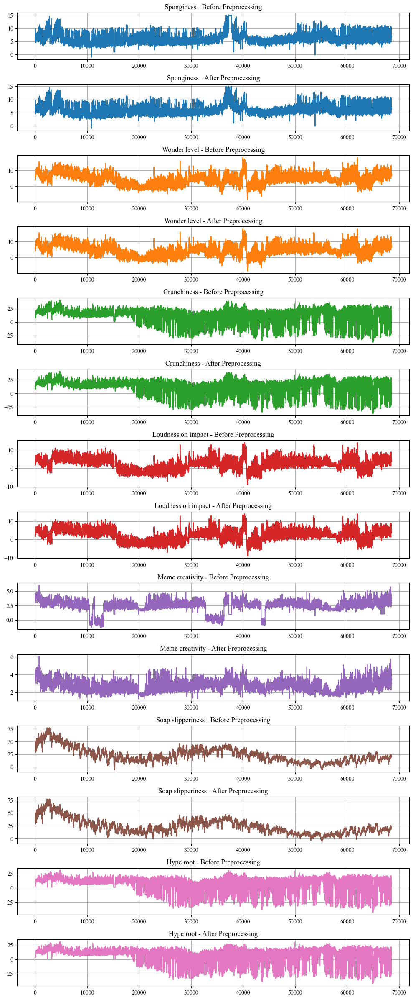

In [8]:
plt.figure(figsize=(10,24))
for i,col in enumerate(colnames):
    plt.subplot(len(colnames)*2,1,2*i+1)
    plt.plot(data_beforeprep[col],color=colors[2*i])
    plt.title(col+" - Before Preprocessing")
    plt.grid(True)
    plt.subplot(len(colnames)*2,1,2*i+2)
    plt.plot(data[col],color=colors[2*i])
    plt.title(col+" - After Preprocessing")
    plt.grid(True)
    plt.tight_layout()
plt.show()

### Train-Test Splitting

In [10]:
TEST_FRACTION = 0.08
test_size = round(nsamples*TEST_FRACTION)
X_train_full_ = data.iloc[:-test_size].to_numpy()
X_test_full_ = data.iloc[-test_size:].to_numpy()
print("Whole dataset shape:",data.shape)
print("Training dataset shape:",X_train_full_.shape)
print("Testing dataset shape:",X_test_full_.shape)

Whole dataset shape: (68528, 7)
Training dataset shape: (63046, 7)
Testing dataset shape: (5482, 7)


### Normalization

After this cell, the dataset is bounded in the range [0,1] and split in the training and validation subsets

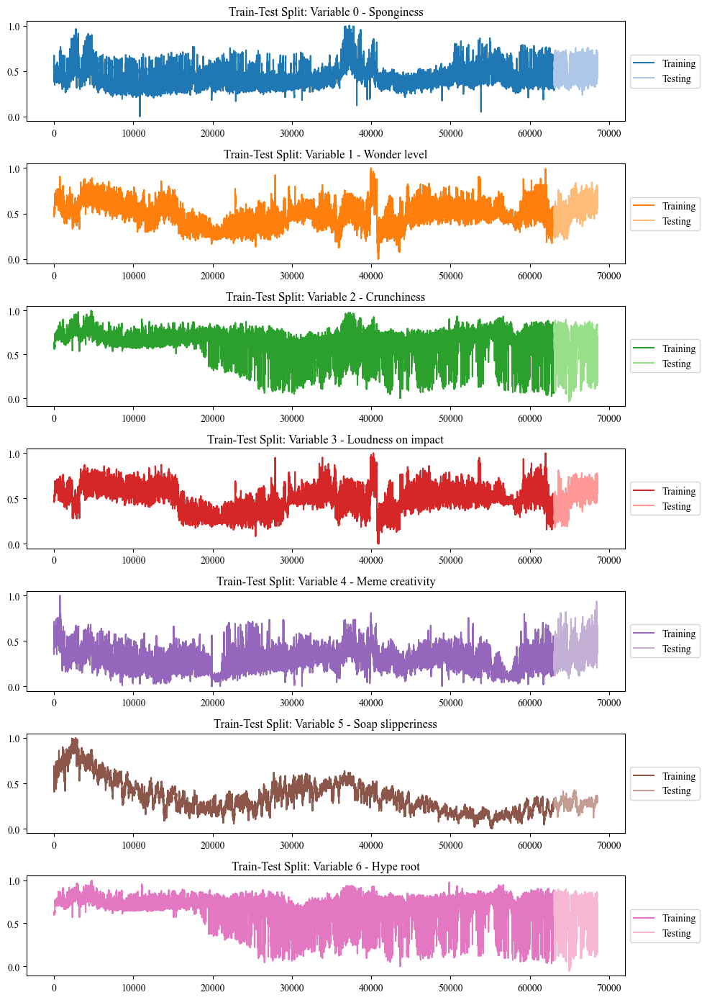

In [11]:
VAR=[0,1,2,3,4,5,6] # Can be changed to perform univariate prediction or for accounting only some variables

X_min = np.min(X_train_full_,axis=0)
X_max = np.max(X_train_full_,axis=0)
X_train_full = (X_train_full_-X_min)/(X_max-X_min)
X_test_full = (X_test_full_-X_min)/(X_max-X_min)
datanorm = (data-X_min)/(X_max-X_min)

X_train_full = X_train_full[:,VAR]
X_test_full = X_test_full[:,VAR]

traintime = np.arange(0,X_train_full.shape[0])
testtime = np.arange(X_train_full.shape[0],X_train_full.shape[0]+X_test_full.shape[0])

plt.figure(figsize=(10,14))
for col in range(len(VAR)):  
    plt.subplot(len(colnames),1,col+1)
    plt.plot(traintime, X_train_full[:,col], color = colors[2*col],label='Training')
    plt.plot(testtime, X_test_full[:,col], color = colors[2*col+1],label='Testing')
    plt.title(f"Train-Test Split: Variable {col} - {colnames[col]}")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
plt.show()

864 future samples must be predicted. In order to avoid having to crop data after the prediction, the telescope will be set to one of the factors of 864 

In [12]:
def factors(n):    
    return set(
        reduce(list.__add__, 
        ([i, n//i] for i in range(1, int(n**0.5) + 1) if n % i == 0))
    )

# If the chosen telescope isn't a factor of 864, this function chooses the closest one among the available factors
def closest_available_telescope(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

TEST_TELESCOPE = 864
telescopes = sorted(factors(TEST_TELESCOPE))
print("AVAILABLE TELESCOPES:",telescopes)

AVAILABLE TELESCOPES: [1, 2, 3, 4, 6, 8, 9, 12, 16, 18, 24, 27, 32, 36, 48, 54, 72, 96, 108, 144, 216, 288, 432, 864]


### Windowing

In [13]:
def build_sequences_multiwindow(data, windows, stride=500, telescope=288):
    maxw = max(windows)
    LEN = data.shape[0]
    ddata=[[] for w in windows]
    ffuture=[]
    padding_len = LEN%maxw
    if(padding_len != 0):
        data=data[padding_len:]
        assert data.shape[0]%maxw == 0
    indexes = []
    for idx in np.arange(maxw,LEN-stride-maxw-telescope,stride):
        idxx = []
        for i,w in enumerate(windows):
            ddata[i].append(data[(idx-w):idx])
            idxx.append(idx-w)
        idxx.append(idx)
        ffuture.append(data[idx:idx+telescope])
        idxx.append(idx+telescope)
        indexes.append(idxx)
    ddata = [np.stack(x,axis=0) for x in ddata]
    future = np.array(ffuture)
    return ddata, future, indexes

################################################################################
#####                       WINDOWING PARAMETERS                          ######
################################################################################
WINDOWS = [400,40]
STRIDE    = 5
TELESCOPE = 24
# [1, 2, 3, 4, 6, 8, 9, 12, 16, 18, 24, 27, 32, 36, 
#  48, 54, 72, 96, 108, 144, 216, 288, 432, 864]
################################################################################
WINDOWS.sort(reverse=True)
TELESCOPE = closest_available_telescope(telescopes,TELESCOPE)
Xtrain,Ytrain,tridxs = build_sequences_multiwindow(X_train_full, WINDOWS, stride=STRIDE, telescope=TELESCOPE)
Xtest,Ytest,tsidxs = build_sequences_multiwindow(X_test_full, WINDOWS, stride=STRIDE, telescope=TELESCOPE)

Xtrain_shapes = [ww[0].shape for ww in Xtrain]
Xtest_shapes = [ww[0].shape for ww in Xtest ]
Ytrain_shape = Ytrain[0].shape
Ytest_shape = Ytest[0].shape

print(">> SLICING PARAMTERS")
print("WINDOWS  : ",WINDOWS)  
print("STRIDE   : ",STRIDE) 
print("TELESCOPE: ",TELESCOPE)  
print()
print(">> DATASET SHAPES")
print("Xtrain shape: ",len(Xtrain[0]),"x",Xtrain_shapes,end=" --> ")
print("Ytrain shape: ",len(Ytrain),"x",Ytrain_shape)
print("Xtest shape : ",len(Xtest[0]),"x",Xtest_shapes,end=" --> ")
print("Ytest shape : ",len(Ytest),"x",Ytest_shape)
print()

>> SLICING PARAMTERS
WINDOWS  :  [400, 40]
STRIDE   :  5
TELESCOPE:  24

>> DATASET SHAPES
Xtrain shape:  12444 x [(400, 7), (40, 7)] --> Ytrain shape:  12444 x (24, 7)
Xtest shape :  931 x [(400, 7), (40, 7)] --> Ytest shape :  931 x (24, 7)



**Data returned from *build_sequences***
* X: list of as many windows as the one specified in `WINDOWS`. Each element of the list is a tensor of shape `NUM_WINDOWS x WINDOW_SIZE x VARIABLES`
* Y: tensor of shape `NUM_WINDOWS x TELESCOPE_SIZE x VARIABLES`
* IDXS: Indexes where the input and output windows start/stop, as follow, as a list of `NUM_WINDOWS_ELEMENTS`. Each element in the list is an array with the structure:
`[START_OF_WIN1, START_OF_WIN2, START_OF_WIN3, ... ,START_OF_PREDICTION, END_OF_PREDICTION ]`

**!!!! WINDOWS ARE SORTED IN DESCENDING ORDER (the biggest window is the first in the list)**

Example of signal windowing

Sponginess


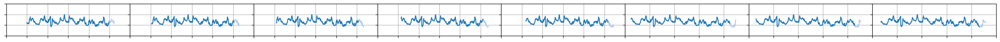

Wonder level


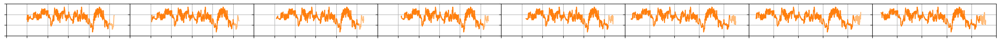

Crunchiness


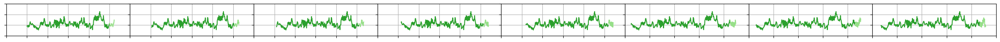

Loudness on impact


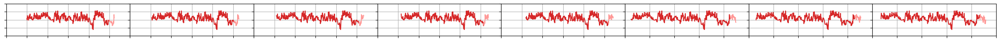

Meme creativity


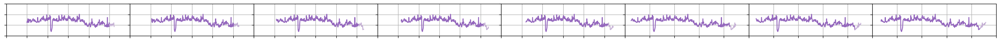

Soap slipperiness


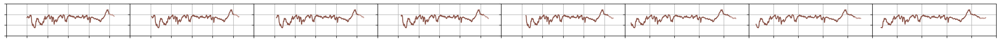

Hype root


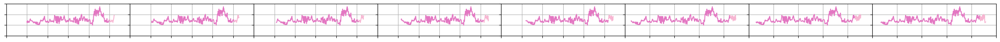

In [14]:
NUM_WINDOWS = 8
for var in range(len(VAR)):
    plt.figure(figsize=(30,1))
    for window in range(NUM_WINDOWS):
        plt.subplot(1,NUM_WINDOWS,window+1)
        plt.plot(range(tridxs[window][0],tridxs[window][-2]),Xtrain[0][window,:,var], color = colors[2*var],);
        plt.plot(range(tridxs[window][-2],tridxs[window][-1]),Ytrain[window,:,var],color = colors[2*var+1],);
        # plt.ylim([0,1])
        xt,_ = plt.xticks()
        plt.xticks(ticks=xt,labels=[])
        yt,_ = plt.yticks()
        plt.yticks(ticks=yt,labels=[])
        plt.grid(True)
    plt.subplots_adjust(wspace=0, hspace=0)
    print(colnames[var])
    plt.show();

### Building The Model

`build_model` constructs the model architecture 

In [ ]:
from keras.layers import *
from keras.models import *
from keras import backend as K

def build_model(input_shapes, output_shape,p):
    input_layers = [tfkl.Input(shape=sh, name=f"Input_W{WINDOWS[i]}") for i,sh in enumerate(input_shapes)]

    halfway=[]
    for w,input_layer in enumerate(input_layers):
        x = tfkl.Conv1D(
            kernel_size=p["units"][0], 
            filters=p["filters"][0], 
            strides=1,
            padding='same', 
            activation='relu',
            name=f'CONV0_W{WINDOWS[w]}',
            kernel_regularizer=tfk.regularizers.L2(p["l2"]),
        )(input_layer)
        x = tfkl.Bidirectional(tfkl.LSTM(
            units = p["units"][0],
            return_sequences=True,
            name=f'LSTM0_W{WINDOWS[w]}',
            kernel_regularizer=tfk.regularizers.L2(p["l2"]),
        ))(x)
        x = tfkl.Conv1D(
            kernel_size=p["units"][0], 
            filters=p["filters"][0], 
            strides=1,
            padding='same', 
            activation='relu',
            name=f'CONV00_W{WINDOWS[w]}',
            kernel_regularizer=tfk.regularizers.L2(p["l2"]),
        )(x)
        
        if p["dense"] is not False:
            x = tfkl.Dense(
                units = p["units"][0],
                name=f'DENSE0_W{WINDOWS[w]}'
            )(x)

        if p["dropout"] is not False:
            x = tfkl.Dropout(p["dropout"])(x)

        for s in range(1,p["stacks"]):
            x = tfkl.Bidirectional(tfkl.LSTM(
                units = p["units"][s],
                return_sequences=True,
                name=f'LSTM{s}_W{WINDOWS[w]}',
                kernel_regularizer=tfk.regularizers.L2(p["l2"]),
            ))(x)
            x = tfkl.Conv1D(
                kernel_size=p["units"][s], 
                filters=p["filters"][s], 
                strides=1,
                padding='same', 
                # activation='relu',
                name=f'CONV{s}_W{WINDOWS[w]}',
                kernel_regularizer=tfk.regularizers.L2(p["l2"]),
            )(x)

            if p["dense"] is not False:
                x = tfkl.Dense(
                    units = p["units"][s],
                    name=f'DENSE{s}_W{WINDOWS[w]}'
                )(x)

            if p["dropout"] is not False:
                x = tfkl.Dropout(p["dropout"])(x)

        x = tfkl.Flatten(name=f'FLATTEN_W{WINDOWS[w]}')(x)
        halfway.append(tfkl.Dense(output_shape[-1]*output_shape[-2], activation=p["final_activation"])(x))
    
    x = tfkl.Concatenate()(halfway)
    x = tfkl.Dense(output_shape[-1]*output_shape[-2], activation=p["final_activation"])(x)
    x = tfkl.Dense(output_shape[-1]*output_shape[-2], activation=p["final_activation"])(x)
    x = tfkl.Reshape((output_shape[-2],output_shape[-1]))(x)

    output_layer = x
    model = tfk.Model(inputs=input_layers, outputs=output_layer, name='MultiWindowModel')

    return model


>> MODEL
Name:  MultiWindowModel
Trainable parameters:  1226680
STACKS:  2

Model: "MultiWindowModel"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Input_W400 (InputLayer)         [(None, 400, 7)]     0                                            
__________________________________________________________________________________________________
Input_W40 (InputLayer)          [(None, 40, 7)]      0                                            
__________________________________________________________________________________________________
CONV0_W400 (Conv1D)             (None, 400, 8)       2248        Input_W400[0][0]                 
__________________________________________________________________________________________________
CONV0_W40 (Conv1D)              (None, 40, 8)        2248        Input_W40[0][0]                  
______

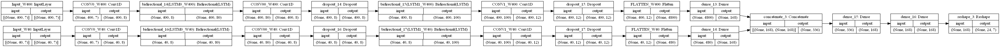

In [ ]:
################################################################################
#####                         MODEL PARAMETERS                            ######
################################################################################
MODEL_PARAMETERS = {
    "stacks"           :  2,     # Number of BidirLSTM+Conv blocks
    "units"            :  [40,50], # LSTM units per block
    "filters"          :  [8,12],# Conv filters per block
    "padding"          :  "same",
    "l2"               :  1e-5,
    "dropout"          :  0.5,
    "GAP"              :  False, # True if GAP replaces the flatten
    "dense"            :  False, # True if a block becomes BidirLSTM+Conv+Dense
    "final_activation" :  "sigmoid",
}
################################################################################

model = build_model(
   Xtrain_shapes, 
   Ytrain_shape,
   MODEL_PARAMETERS,
)

trainables = count_params(model.trainable_weights)
print()
print(">> MODEL")
print("Name: ",model.name)
print("Trainable parameters: ", trainables) 
print("STACKS: ",MODEL_PARAMETERS["stacks"])
print()
print(model.summary())
tfk.utils.plot_model(model,show_shapes=True,rankdir='LR')

## Training

This callback draws, at the end of each epoch, a prediction for each variable for a random window. It's useful to visually monitor the quality of the output during the training

In [ ]:
def inspect_on_epoch_predictions(X, y, preds,epoch_test_win):
    vars=VAR
    plt.figure(figsize=(4*len(vars),1))
    for i, col in enumerate(vars):
        plt.subplot(1, len(vars) ,i+1);
        plt.plot(range(tsidxs[epoch_test_win][0], tsidxs[epoch_test_win][-2]), X[:,i], label="Data")
        plt.plot(range(tsidxs[epoch_test_win][-2],tsidxs[epoch_test_win][-1]), preds[:,i], label="Predicted Future")
        plt.plot(range(tsidxs[epoch_test_win][-2],tsidxs[epoch_test_win][-1]), y[:,i], label="Real Future")
        plt.fill_between(
            range(tsidxs[epoch_test_win][-2],tsidxs[epoch_test_win][-1]), 
            preds[:,i]+np.abs(y[:,i]-preds[:,i]), 
            preds[:,i]-(np.abs(y[:,i]-preds[:,i])), 
            color='orange',
            alpha=.3,
            label="Prediction Error"
            )
        xlims = plt.xlim()
        plt.xlim([xlims[0]+(xlims[1]-xlims[0])/2, xlims[1]])
        plt.ylim(0,1)
        plt.grid(True)
        xt,_ = plt.xticks()
        plt.xticks(ticks=xt,labels=[])
        yt,_ = plt.yticks()
        plt.yticks(ticks=yt,labels=[])
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

class show_on_epoch_forecast(tf.keras.callbacks.Callback):
    def on_epoch_end(self, batch, logs=None):
        epoch_test_win=np.random.randint(0,Xtest[-1].shape[0])
        X = [np.expand_dims(Xt[epoch_test_win],axis=0) for Xt in Xtest]
        preds = model.predict(X)[0]
        inspect_on_epoch_predictions(X[0][0], Ytest[epoch_test_win], preds,epoch_test_win)

In [ ]:
def RMSE(true, pred):
    return np.sqrt(np.mean(np.square(pred - true))) 
def MSE(true, pred):
    return np.mean(np.square(pred - true))
def MAE(true, pred):
    return np.abs(np.mean(np.square(pred - true))) 
def RMSEloss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true), axis=-1)) 
def MSEloss(y_true, y_pred):
    return K.mean(K.square(y_pred - y_true), axis=-1)
def MAEloss(y_true, y_pred):
    return K.abs(K.mean(K.square(y_pred - y_true), axis=-1)) 

def scheduler(epoch, lr):
    if epoch%15==0 and epoch > 10:
        return lr*0.5
    else: 
        return lr*1.0

def plot_training_history(history):
    print()
    print(">> TRAINING HISTORY")
    plt.figure(figsize=(30,4))
    plt.subplot(1,3,1)
    plt.plot(history['MSEloss'], label='Training RMSE', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_MSEloss'], label='Validation RMSE', alpha=.9, color='#5a9aa5')
    plt.title('MSE')
    plt.legend()
    plt.grid(alpha=.3)
    plt.subplot(1,3,2)
    plt.plot(history['RMSEloss'], label='Training MSE', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_RMSEloss'], label='Validation MSE', alpha=.9, color='#5a9aa5')
    plt.title('RMSE')
    plt.legend()
    plt.grid(alpha=.3)
    plt.subplot(1,3,3)
    plt.plot(history['MAEloss'], label='Training MAE', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_MAEloss'], label='Validation MAE', alpha=.9, color='#5a9aa5')
    plt.title('MAE')
    plt.legend()
    plt.grid(alpha=.3)
    plt.show()
    
def inspect_test(X, y, pred, columns, TELESCOPE, idx=None):
    plt.figure(figsize=(10,1*len(columns)))
    for i, col in enumerate(columns):
        plt.subplot(7,1,i+1);
        plt.plot(np.arange(len(X[:,i])), X[:,i],label="Data")
        plt.plot(np.arange(len(X[:,i]), len(X[:,i])+TELESCOPE), pred[:,i],label="Predicted Future")
        plt.plot(np.arange(len(X[:,i]), len(X[:,i])+TELESCOPE), y[:,i],label="Real Future")
        plt.fill_between(
          np.arange(len(X[:,i]), len(X[:,i])+TELESCOPE), 
          pred[:,i]+np.abs(y[:,i]-pred[:,i]), 
          pred[:,i]-(np.abs(y[:,i]-pred[:,i])), 
          color='orange',
          alpha=.3,
          label="Prediction Error"
        )
        plt.grid(True)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),ncol=4)
    return plt.gcf()

In [ ]:
################################################################################
#####                        TRAINING PARAMETERS                          ######
################################################################################
LEARNING_RATE = 1e-3

EPOCHS        = 50
BATCH_SIZE    = 128
################################################################################

MODELNAME=f"W{WINDOWS}_T{TELESCOPE}_S{STRIDE}_"+str(MODEL_PARAMETERS)+f"_BS{BATCH_SIZE}_LR{     LEARNING_RATE}"

print(">> TRAINING")
print("LEARNING_RATE  : ",LEARNING_RATE)
print("EPOCHS         : ",EPOCHS)     
print("BATCH_SIZE     : ",BATCH_SIZE)  

model.compile(
    loss=MSEloss,
    optimizer=tfk.optimizers.Adam(LEARNING_RATE),
    metrics=[MSEloss,RMSEloss,MAEloss,]
)

history = model.fit(
    x = Xtrain,
    y = Ytrain,
    batch_size = BATCH_SIZE,
    epochs = EPOCHS,
    validation_split=0.25,
    callbacks = [
        tfk.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=20, restore_best_weights=True),
    #    tfk.callbacks.LearningRateScheduler(scheduler),
        tfk.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=5, factor=0.5, min_lr=1e-6),
        show_on_epoch_forecast()
    ]
).history
plot_training_history(history)

print()
print(">> PREDICTIIONS ON",TEST_TELESCOPE,"SAMPLES")

maxw = max(WINDOWS)
idx_from = random.randint(0,X_test_full.shape[0]-TEST_TELESCOPE-maxw)
print(f"Testing prediction in test-range: [{idx_from}:{idx_from+TEST_TELESCOPE}]")
X_temp = X_test_full[idx_from-maxw:idx_from]

Ypred = []
for w in range(TEST_TELESCOPE//TELESCOPE):
    X = [np.expand_dims(X_temp[-w:],axis=0) for w in WINDOWS]
    preds = model.predict(X)[0]
    X_temp = np.concatenate((X_temp,preds),axis=0)
    Ypred.append(preds)

Ypred = np.concatenate(Ypred)
X_train_full_denorm = X_min + X_train_full*(X_max-X_min)
X_test_full_denorm = X_min + X_test_full*(X_max-X_min)
Ypred_denorm = X_min + Ypred*(X_max-X_min)

print("RMSE:",RMSE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))
print("MSE:",MSE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))
print("MAE:",MAE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))

inspect_test(
        X_test_full_denorm[idx_from-maxw:idx_from],
        X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE],
        Ypred_denorm,
        VAR,
        TEST_TELESCOPE,
)
tf.keras.utils.plot_model(model, to_file=os.path.join(output_dir,"ARCH_"+MODELNAME+".jpg"))
model.save(os.path.join(output_dir,"MODEL_"+MODELNAME+".h5"))

################################################################################
#####                        REFINING PARAMETERS                          ######
################################################################################
EPOCHS_REFINING        = 2       # Keep Low to avoid overfitting
LEARNING_RATE_REFINING = model.optimizer.lr.numpy()*0.05    # Restarts from last LR/10
BATCH_SIZE_REFINING    = BATCH_SIZE
################################################################################

Xfull,Yfull,fullidxs = build_sequences_multiwindow(data, WINDOWS, stride=STRIDE, telescope=TELESCOPE)

Xfull_shapes = [ww[0].shape for ww in Xfull]
Yfull_shape = Yfull[0].shape

print(">> SLICING PARAMTERS")
print("WINDOWS  : ",WINDOWS)  
print("STRIDE   : ",STRIDE) 
print("TELESCOPE: ",TELESCOPE)  
print()
print(">> DATASET SHAPES")
print("Xfull shape: ",len(Xfull[0]),"x",Xfull_shapes,end=" --> ")
print("Yfull shape: ",len(Yfull),"x",Yfull_shape)
print()

MODELNAME=f"W{WINDOWS}_T{TELESCOPE}_S{STRIDE}_"+str(MODEL_PARAMETERS)+f"_BS{BATCH_SIZE_REFINING}_LR{LEARNING_RATE_REFINING}_refined"

print(">> TRAINING")
print("LEARNING_RATE_REFINING  : ",LEARNING_RATE_REFINING)
print("EPOCHS_REFINING         : ",EPOCHS_REFINING)     
print("BATCH_SIZE_REFINING     : ",BATCH_SIZE_REFINING)  


model.compile(
    loss=MSEloss,
    optimizer=tfk.optimizers.Adam(LEARNING_RATE_REFINING),
    metrics=[MSEloss,RMSEloss,MAEloss,]
)

history = model.fit(
    x = Xtrain,
    y = Ytrain,
    batch_size = BATCH_SIZE_REFINING,
    epochs = EPOCHS_REFINING,
    validation_split=0.05,
    callbacks = [
        tfk.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=20, restore_best_weights=True),
    #    tfk.callbacks.LearningRateScheduler(scheduler),
        tfk.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=5, factor=0.5, min_lr=1e-6),
        show_on_epoch_forecast()
    ]
).history
plot_training_history(history)
print()
print(">> PREDICTIIONS ON",TEST_TELESCOPE,"SAMPLES")

maxw = max(WINDOWS)
idx_from = random.randint(maxw,X_test_full.shape[0]-TEST_TELESCOPE-maxw)
print(f"Testing predction in test-range: [{idx_from}:{idx_from+TEST_TELESCOPE}]")
X_temp = X_test_full[idx_from-maxw:idx_from]

Ypred = []
for w in range(TEST_TELESCOPE//TELESCOPE):
    X = [np.expand_dims(X_temp[-w:],axis=0) for w in WINDOWS]
    preds = model.predict(X)[0]
    X_temp = np.concatenate((X_temp,preds),axis=0)
    Ypred.append(preds)

Ypred = np.concatenate(Ypred)
X_train_full_denorm = X_min + X_train_full*(X_max-X_min)
X_test_full_denorm = X_min + X_test_full*(X_max-X_min)
Ypred_denorm = X_min + Ypred*(X_max-X_min)

print("RMSE:",RMSE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))
print("MSE:",MSE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))
print("MAE:",MAE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))

inspect_test(
        X_test_full_denorm[idx_from-maxw:idx_from],
        X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE],
        Ypred_denorm,
        VAR,
        TEST_TELESCOPE,
)
model.save(os.path.join(output_dir,"MODEL_"+MODELNAME+".h5"))

### Predicting the future

Testing predoction in test-range: [552:1416]
RMSE: 5.836099092339499
MSE: 34.06005261560592
MAE: 34.06005261560592


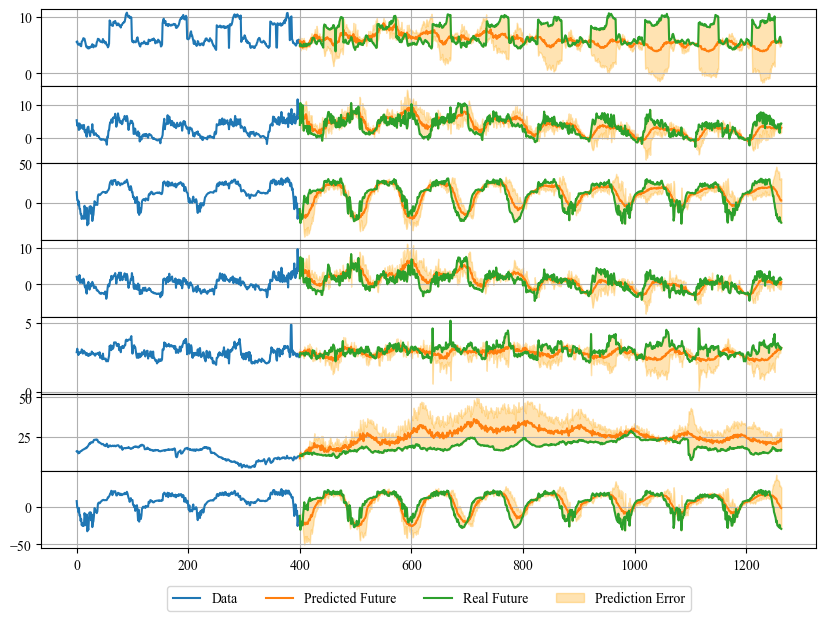

In [ ]:
maxw = max(WINDOWS)
idx_from = random.randint(maxw,X_test_full.shape[0]-TEST_TELESCOPE-maxw)

print(f"Testing predoction in test-range: [{idx_from}:{idx_from+TEST_TELESCOPE}]")
X_temp = X_test_full[idx_from-maxw:idx_from]

Ypred = []
for w in range(TEST_TELESCOPE//TELESCOPE):
    X = [np.expand_dims(X_temp[-w:],axis=0) for w in WINDOWS]
    preds = model.predict(X)[0]
    X_temp = np.concatenate((X_temp,preds),axis=0)
    Ypred.append(preds)

Ypred = np.concatenate(Ypred)
X_train_full_denorm = X_min + X_train_full*(X_max-X_min)
X_test_full_denorm = X_min + X_test_full*(X_max-X_min)
Ypred_denorm = X_min + Ypred*(X_max-X_min)

print("RMSE:",RMSE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))
print("MSE:",MSE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))
print("MAE:",MAE(X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE], Ypred_denorm))

inspect_test(
     X_test_full_denorm[idx_from-maxw:idx_from],
     X_test_full_denorm[idx_from:idx_from+TEST_TELESCOPE],
     Ypred_denorm,
     VAR,
     TEST_TELESCOPE,
)

### Automatic submission generator

In [ ]:
modelpy = """
import os
import tensorflow as tf
import numpy as np
from tensorflow.keras import backend as K

class model:
    def __init__(self, path):
    
        def RMSEloss(y_true, y_pred):
            return K.sqrt(K.mean(K.square(y_pred - y_true), axis=-1)) 
        def MSEloss(y_true, y_pred):
            return K.mean(K.square(y_pred - y_true), axis=-1)
        def MAEloss(y_true, y_pred):
            return K.abs(K.mean(K.square(y_pred - y_true), axis=-1)) 
        
        self.model = tf.keras.models.load_model(
            os.path.join(path, 'model.h5'),
            custom_objects={
                'RMSEloss':RMSEloss,
                'MSEloss': MSEloss,
                'MAEloss': MAEloss,
                }
        )

    def predict(self, X):\n"""

modelpy+="        TEST_TELESCOPE = "+str(TEST_TELESCOPE)+"\n\n"
        
modelpy+="        WINDOWS   = "+str(WINDOWS)+"\n"
modelpy+="        TELESCOPE = "+str(TELESCOPE)+"\n\n"
        
modelpy+="""        X_min = np.min(X, axis=0)
        X_max = np.max(X, axis=0)
        
        X_temp = (X-X_min)/(X_max-X_min)
        Ypred = []
        maxw = max(WINDOWS)
        for w in range(TEST_TELESCOPE//TELESCOPE):
            X = X_temp[-maxw:]
            X = [np.expand_dims(X[-w:],axis=0) for w in WINDOWS]
            preds = self.model.predict(X)[0]
            X_temp = np.concatenate((X_temp,preds),axis=0)
            Ypred.append(preds)
        Ypred = np.concatenate(Ypred)
        Ypred_denorm = X_min + Ypred*(X_max-X_min)
        Ypred_tensor = tf.convert_to_tensor(Ypred_denorm)
        
        return Ypred_tensor
"""
with open('model.py', 'w') as f:
    f.write(modelpy)
with open('metadatapy', 'w') as f:
    f.write("")
model.save("model.h5")
!zip Sub.zip model.py model.h5 metadata

	zip warning: name not matched: metadata
updating: model.py (deflated 63%)
updating: model.h5 (deflated 14%)
